# Correlation times

In [1]:
# Load packages 

using Plots
using OffsetArrays
using Random
using ProgressMeter
using Statistics
using Plots.PlotMeasures
using LinearAlgebra
using LaTeXStrings
using HDF5
using CSV
using CSVFiles

## Review

Last day we began discussing the 2D Ising Model with Energy:
\begin{equation}
H=\sum_{ij} -J \left[\sigma_{i,j}\sigma_{i+1,j}+\sigma_{i,j}\sigma_{i,j+1}\right]-h\sigma_{i,j}
\end{equation}
We used units where $J=1$, and wrote

In [2]:
function Energy(s #=spin configuration=#,h)
    m, n = size(s)
    E=0.
    @inbounds for i in 1:m
        @inbounds for j in 1:n
            E+=-s[i,j]*(h+s[mod1(i+1,m),j]+s[i,mod1(j+1,n)])
        end
    end
    return E/(m*n)
end

Energy (generic function with 1 method)

We also claimed that many of the features of this model could be understood from the properties of the magnetization:
\begin{equation}
m=\frac{1}{N}\sum_{ij} \sigma_{i,j}
\end{equation}

In [3]:
Magnetization(s#=spin configuration=#)=mean(s)

Magnetization (generic function with 1 method)

We made code to give us a random spin pattern 

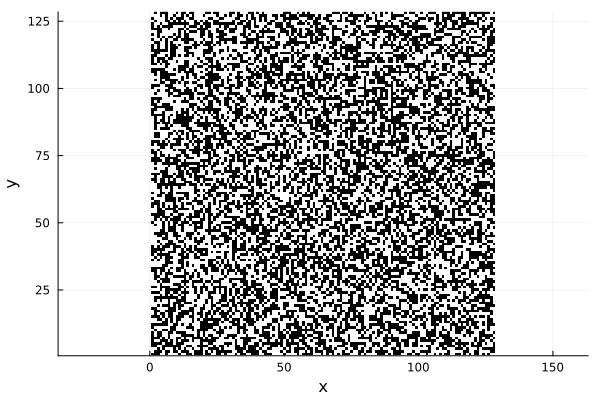

In [4]:
rand_ising2d(m=128, n=m) = rand(Int8[-1, 1], m, n)
heatmap(rand_ising2d(),aspect_ratio=1,
    c=cgrad([:black, :white]),legend=:none,
    xlabel="x",ylabel="y")

We then made a code to use a Markov Chain to generate samples from the equilibrium distribution of this model at temperature $T=1/\beta$.  

In [5]:
function randlocalupdate!(s,probflip,numsweeps)
    m, n = size(s)
    @inbounds for sweep in 1:numsweeps*m*n
        # Choose random spin
        i=rand(1:m)
        j=rand(1:n)
        # Find environment
        τ₁=s[mod1(i-1,m),j]
        τ₂=s[mod1(i+1,m),j]
        τ₃=s[i,mod1(j-1,n)]
        τ₄=s[i,mod1(j+1,n)]
        τ=τ₁+τ₂+τ₃+τ₄
        σ=s[i,j]
        # Propose flip
        if rand()<probflip[σ,τ]
            s[i,j]=-σ
        end
    end
    return s
end

struct isingparams
    β ::Float64
    h ::Float64
end

function randlocalupdate!(s,numsweeps,p::isingparams)
    probflip=isingprobs(p.β,p.h)
    randlocalupdate!(s,probflip,numsweeps)
end

"""
    isingprobs(β,h,numneighbors)

returns a 2D array of probabilities, `probflip[σ,τ]` which is the
probability of flipping a spin if site `i` is in state `σ`, and `τ` is the sum of the 
neighbor spins.  Here `sigma` is `1` or `-1` and `τ` goes from `-numneighbors` to `numneighbors`. 

``P_{\\rm flip}(\\sigma,\\tau)= e^{-2 \\beta  \\sigma \\tau -2 \\beta h \\sigma}``
"""
isingprobs(β,h=0,numneighbors=4)=
    OffsetArray([exp(-2*β*(τ+h)*σ) for σ in -1:1, τ in -numneighbors:numneighbors],
    -1:1,-numneighbors:numneighbors)

isingprobs

  0.802045 seconds (65.75 k allocations: 4.326 MiB, 1.98% compilation time)


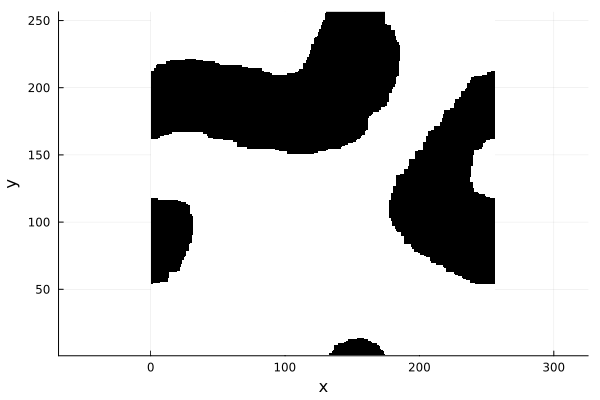

In [6]:
# sample usage
m1=2^8
β1=10.
h1=0.
s1=rand_ising2d(m1)
p1=isingprobs(β1,h1)
@time randlocalupdate!(s1,p1,10^3)
heatmap(s1,
    aspect_ratio=1,c=cgrad([:black, :white]),legend=:none,
    xlabel="x",ylabel="y")

That code is super-simple, and works great. 

With it we can uncover the basic physics:  At low temperatures the system is ordered -- all the spins point in the same direction.  At high temperature it is random.

## Correlation and Relaxation Times

Today we are **not** going to talk about the physics of the Ising Model.  Instead we are going to talk about properties of the algorithm -- viewing the Markov Chain as a dynamical system.  This will be essential to understand how to use it.

<h2 style="border: 2px solid #000; border-radius: 10px; padding: 20px; background-color:red; color:white;" >
## Mini Lab 1
</h2>

We want to make a function, which takes an initial configuration, and updates it with our algorithm, recording the energy and magnetization at some regular intervals.  To do this we need several parameters:

* `β`, `h`, `m`, `n` -- the inverse temperature, magnetic field, and the geometry
* optional: `s` -- the initial configuration.  If we give `s`, then you don't need `m` and `n`
* `innersweeps` -- how many sweeps to do between every measurement of `Energy` and `Magnetization`.  We might want to keep this equal to `1` if things converge quickly, or up this number if it is taking a long time to converge.  I like to think of it as our "stepsize"
* `outersweeps` -- how many total measurements we want to do

It should then return a named tuple with several entries:  `(Elist=??,maglist=??,dims=??,β=??, h=??,innersweeps=??)`.  Here dims is the dimension of the lattice.  We will need it later

Here is an outline function -- you just need to fill in the blanks.  If you want to be able to call by keyword, add the appropriate convenience methods.

In [7]:
function simulate(m::Int64,n::Int64,β::Float64,h::Float64,
        innersweeps::Int64,outersweeps::Int64)
    s=rand_ising2d(m,n)
    simulate!(s,β,h,innersweeps,outersweeps)
end

function simulate!(s,β::Float64,h::Float64,
        innersweeps::Int64,outersweeps::Int64)
    # First generate the probability distribution


    # Create empty lists for storing the energies and magnetizations


    # next do the outer loop
    for outer in 1:outersweeps
        # 
        # call randlocalupdate! -- passing the number of innersweeps
        # then calculate/store E and m in the lists

    end

    return (Elist= ,maglist=, m= , dims= ,h= ,innersweeps=innersweeps)
end

LoadError: ParseError:
[90m# Error @ [0;0m]8;;file:///Users/emueller/Documents/Work Laptop 2011-2012/PHYS 4480-7680 Computational Physics/lectures/In[7]#23:20\[90mIn[7]:23:20[0;0m]8;;\

    return (Elist= [48;2;120;70;70m,[0;0mmaglist=, m= , dims= ,h= ,innersweeps=innersweeps)
[90m#                  ╙ ── [0;0m[91munexpected `,`[0;0m

Once you have the function working, see if you can run it for a sequence of temperatures, and plot the average of the absolute value of the magnetization, as a function of temperature.

<div style="border: 2px solid white; border-radius: 10px; padding: 20px; background-color:white; color:black; height: 500px" >
</div>

## How does this algorithm behave?

To understand how the algorithm works, lets just run it for a couple parameters.

In [7]:
# My version of the function

function simulate(m::Int64,n::Int64,β::Float64,h::Float64,
        innersweeps::Int64,outersweeps::Int64)
    s=rand_ising2d(m,n)
    simulate!(s,β,h,innersweeps,outersweeps)
end

function simulate!(s,β::Float64,h::Float64,
        innersweeps::Int64,outersweeps::Int64)
    # First generate the probability distribution

    pflip=isingprobs(β,h)
    
    # Create empty lists for storing the energies and magnetizations

    Elist=Float64[]
    maglist=Float64[]

    # next do the outer loop
    for outer in 1:outersweeps
        # 
        randlocalupdate!(s,pflip,innersweeps)
        E=Energy(s,h)
        mag=Magnetization(s)
        push!(Elist,E)
        push!(maglist,mag)
        # call randlocalupdate!
        # then calcualte/store E and m in the lists

    end

    return (Elist=Elist ,maglist=maglist, dims=size(s) ,β=β ,h=h ,innersweeps=innersweeps)
end

simulate!(;s,β,h,innersweeps,outersweeps)=simulate!(s,β,h,innersweeps,outersweeps)


simulate! (generic function with 2 methods)

Lets take a moderately sized system -- say 64x64, start with a random configuration, and run it a bunch of times.  It is a stochastic algorithm, so one expects different answers each time -- but the average should be robust

  0.245005 seconds (146.64 k allocations: 10.183 MiB, 33.79% compilation time)


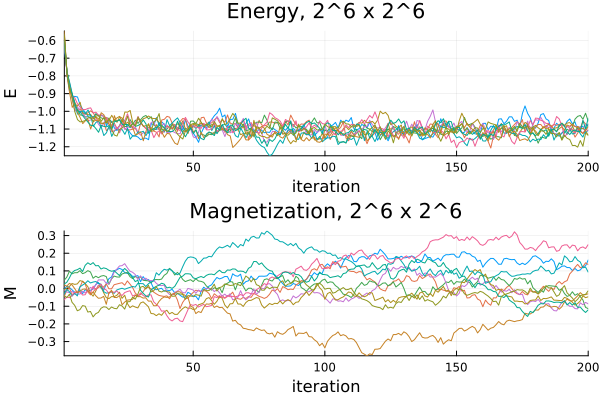

In [8]:
s=rand_ising2d(2^6,2^6)
β=0.4
efig=plot()
mfig=plot()
edata=Array[]
mdata=Array[]
@time for realization in 1:10
    s=rand_ising2d(2^6,2^6)
    run=simulate!(s,β,0.,1,200)
    plot!(efig,run.Elist,widen=false,label="",title="Energy, 2^6 x 2^6",xlabel="iteration",ylabel="E")
    plot!(mfig,run.maglist,widen=false,label="",title="Magnetization, 2^6 x 2^6",xlabel="iteration",ylabel="M")
    push!(edata,run.Elist)
    push!(edata,run.maglist)
end
plot(efig,mfig,layout=[1,1])

It appears that we started in a very rare state.  The probability that we would find that state at that temperature is exponentially small.  Thus if we simply averaged these values, the mean would be skewed by those initial values.  

When we run our Markov Chain, we will therefore have to discard some number of values.  Based on the energy plot, it looks like we would need to discard about 50 entries.  Looking at the magnetization, it is probably closer to 100.  Apparently the energy relaxes to its equilibrium distribution faster than the magnetization.

Lets see if we can extract the *relaxation time*.  Note, we often use the term *time* for Monte-Carlo steps.  I should emphasize however that it bears no relation to actual time.  It is a property of the algorithm, not a property of the physical system or the model.

Lets average a bunch of runs to get good statistics.

In [9]:
s=rand_ising2d(2^6,2^6)
β=0.4
numiter=100
run=simulate!(s,β,0.,1,300)
totalE=run.Elist
totalEsq=(run.Elist).^2
totalm=run.maglist
totalabsm=abs.(run.maglist)
totalmsq=(run.maglist).^2
@time for iter in 2:numiter
    s=rand_ising2d(2^6,2^6)
    run=simulate!(s,β,0.,1,300)
    totalE .+= run.Elist
    totalEsq .+= (run.Elist).^2
    totalm .+= run.maglist
    totalabsm .+= abs.(run.maglist)
    totalmsq .+= (run.maglist).^2
end
meanE=totalE./numiter
meanEsq=totalEsq./numiter
meanm=totalm./numiter
meanabsm=totalabsm./numiter
meanmsq=totalmsq./numiter;

  2.411604 seconds (181.25 k allocations: 13.929 MiB, 0.21% gc time, 2.73% compilation time)


Given that each run is independent, we can use the fluctuations to estimate our *uncertainty* in the means. 

In [10]:
uncertaintyE=@. sqrt((meanEsq-meanE^2)/numiter);
uncertaintym=@. sqrt((meanmsq-meanm^2)/numiter);
uncertaintyabsm=@. sqrt((meanmsq-meanabsm^2)/numiter);

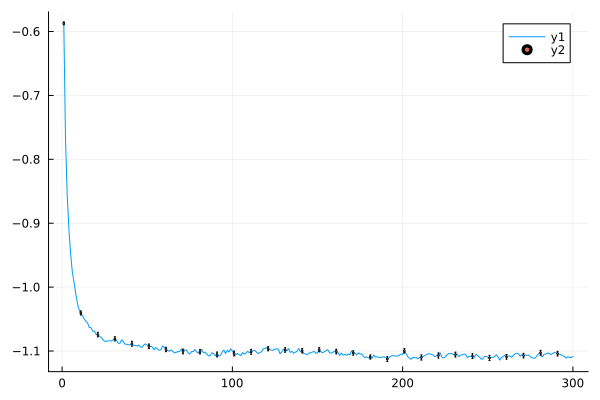

In [11]:
plot(meanE)
scatter!(1:10:length(meanE),meanE[1:10:end],
    markersize=1.,yerr=uncertaintyE[1:10:end])

Those error bars are consistent with the scatter of the points, so we should feel good about them.  Lets try the magnetization

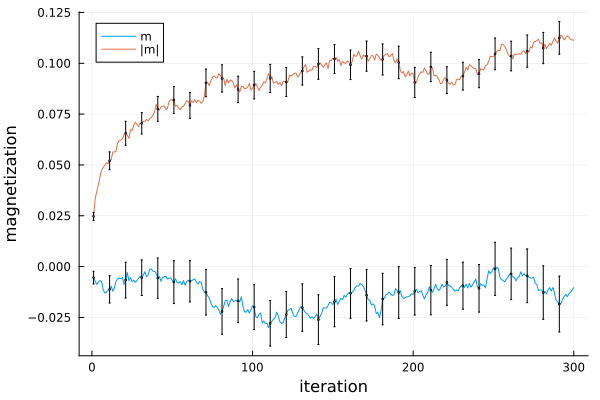

In [12]:
plot(meanm,xlabel="iteration",ylabel="magnetization",label="m")
plot!(meanabsm,label="|m|")
scatter!(1:10:length(meanm),meanm[1:10:end],
    markersize=1.,yerr=uncertaintym[1:10:end],label="")
scatter!(1:10:length(meanabsm),meanabsm[1:10:end],
    markersize=1.,yerr=uncertaintyabsm[1:10:end],label="")

Again, the error bars look reasonable.  They visually appear larger than the energy error bars, and are consistent with the observed jitter in the curve.  

The magnetization is always consistent with zero -- but the absolute value of the magnetization has structure.

We can now define a relaxation time by taking the moment of the distribution.  Later we will define some other characteristic times.

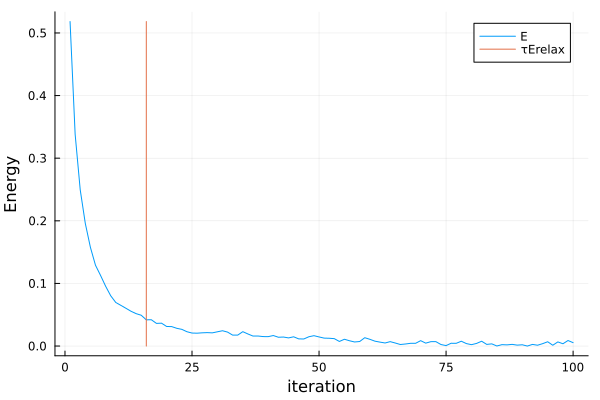

In [13]:
aveE=mean(meanE[100:end])
τErelax=sum(abs(meanE[j]-aveE)*j for j in 1:100)/
        sum(abs(meanE[j]-aveE) for j in 1:100)
plot(abs.(meanE.-aveE)[1:100],label="E",xlabel="iteration",
ylabel="Energy")
plot!([τErelax,τErelax],[0,abs(meanE[1]-aveE)],label="τErelax")

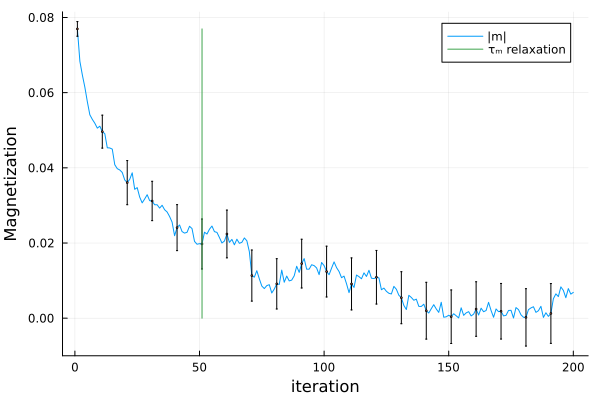

In [14]:
aveabsm=mean(meanabsm[200:end])
τabsmrelax=sum(abs(meanabsm[j]-aveabsm)*j for j in 1:200)/
        sum(abs(meanabsm[j]-aveabsm) for j in 1:200)
plot(abs.(meanabsm.-aveabsm)[1:200],
    label="|m|",xlabel="iteration",
ylabel="Magnetization")
scatter!(1:10:200,abs.(meanabsm[1:10:200].-aveabsm),
    markersize=1.,yerr=uncertaintyabsm[1:10:200],label="")
plot!([τabsmrelax,τabsmrelax],[0,abs(meanabsm[1]-aveabsm)],label="τₘ relaxation")

We could have done the same analysis starting from a different initial state, for example the uniform spin configuration:

  0.161623 seconds (7.61 k allocations: 694.469 KiB)


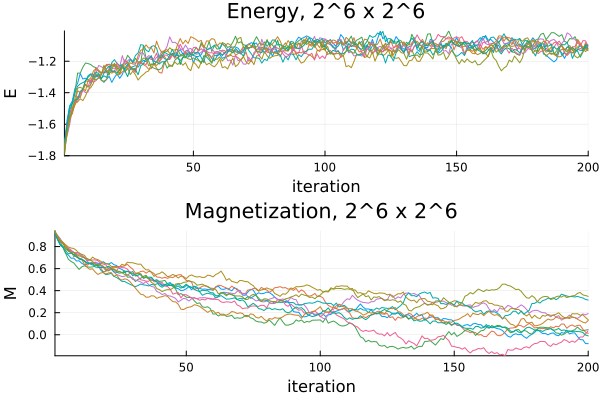

In [15]:
fill!(s,1)
β=0.4
efig=plot()
mfig=plot()
edata=Array[]
mdata=Array[]
@time for realization in 1:10
    fill!(s,1)
    run=simulate!(s,β,0.,1,200)
    plot!(efig,run.Elist,widen=false,label="",title="Energy, 2^6 x 2^6",xlabel="iteration",ylabel="E")
    plot!(mfig,run.maglist,widen=false,label="",title="Magnetization, 2^6 x 2^6",xlabel="iteration",ylabel="M")
    push!(edata,run.Elist)
    push!(mdata,run.maglist)
end
plot(efig,mfig,layout=[1,1])

It looks like the relaxation here was even longer:  The energy looks like it took twice as long to converge, and the magnetization never converged on this timescale.

### Lessons

1. When using Markov chain Monte Carlo, you need to discard a the first few data points -- as you are sampling rare configurations.
2. Starting with good configurations will reduce the relaxation time.

Often we will want to *sweep* parameters.  For example, we may want to know the magnetization as a function of temperature.  A good strategy is to use a configuration from the last temperature as a "seed" for the Markov Chain at the next temperature.  If the temperature step is small, then this will be a plausible configuration for the new temperature.  Thus we have fewer data points we need to throw away.

## Workflow comments

An important thing to pay attention to here was our workflow.  To create those cells that I ran, I did a lot of copy and pasting.  That is great for exploration -- but is really a poor way to work with data.  

One big issue with how we did things is that I used the same global variable name for different data -- which means I can no longer ask questions about the old data.  For example I can look at one of the energy traces in the relaxation-from-uniform data, but I would need to rerun the code if I wanted to look again at the data from the relaxation-from-random runs.

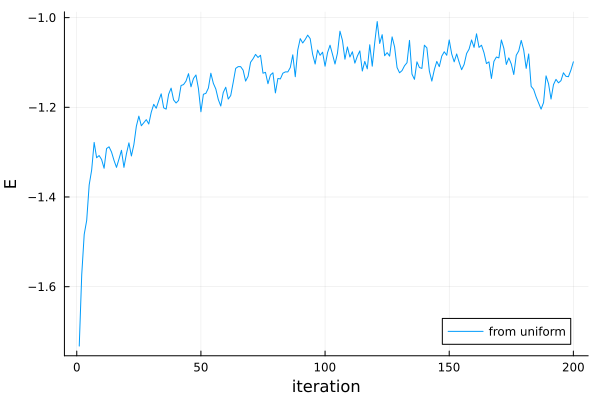

In [17]:
plot(edata[1],xlabel="iteration",ylabel="E",label="from uniform")

The fix for this is once we decide on what we want to do, we turn it into a function

In [42]:
function relax(starts,β,numsteps,numrealizations)
    edata=Array[]
    mdata=Array[]
    for i in 1:numrealizations
        s=copy(starts)
        run=simulate!(s,β,0.,1,numsteps)
        push!(edata,run.Elist)
        push!(mdata,run.maglist)
    end
    return (edata=edata,mdata=mdata)
end

relax (generic function with 1 method)

Now we can quickly run three different temperatures:

In [43]:
@time rdat04=relax(rand_ising2d(2^6,2^6),0.4,300,10);
@time rdat08=relax(rand_ising2d(2^6,2^6),0.8,300,10);
@time rdat02=relax(rand_ising2d(2^6,2^6),0.2,300,10);

  0.241762 seconds (129 allocations: 201.344 KiB)
  0.169209 seconds (129 allocations: 201.344 KiB)
  0.231074 seconds (129 allocations: 201.344 KiB)


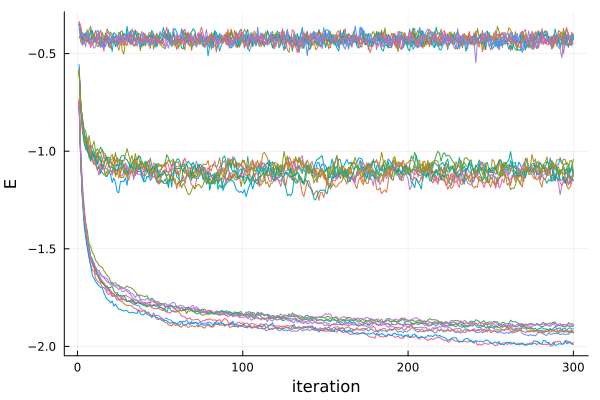

In [44]:
plot(rdat04.edata,label="",xlabel="iteration",ylabel="E")
plot!(rdat08.edata,label="",xlabel="iteration",ylabel="E")
plot!(rdat02.edata,label="",xlabel="iteration",ylabel="E")

If the data took a long time to collect, then it is also good practice to save it to disk.  A good generic data format is `hdf5`.  That is a heirarchical format which stores things in a nice compressed binary format.  It is a broadly used file format, so it is portable (can be opened in Python, or any other language.)

In the current context the only tricky thing is that we need to convert our array of arrays into matrices, using `hcat`

In [84]:
using HDF5

In [57]:
h5open("relax.h5", "w") do file
    write(file, "edat04", hcat(rdat04.edata...)) 
    write(file, "mdat04", hcat(rdat04.mdata...)) 
end

In [60]:
datastream=h5open("relax.h5", "r")

🗂️ HDF5.File: (read-only) relax.h5
├─ 🔢 edat04
└─ 🔢 mdat04

In [63]:
read(datastream["edat04"])

300×10 Matrix{Float64}:
 -0.556641  -0.592773  -0.587891  …  -0.585938  -0.599609  -0.584961
 -0.754883  -0.762695  -0.776367     -0.788086  -0.768555  -0.761719
 -0.854492  -0.863281  -0.827148     -0.842773  -0.838867  -0.836914
 -0.90918   -0.946289  -0.883789     -0.928711  -0.90625   -0.924805
 -0.930664  -0.978516  -0.899414     -0.929688  -0.943359  -0.954102
 -0.981445  -0.99707   -0.949219  …  -0.932617  -0.99707   -0.963867
 -1.00195   -1.02441   -0.998047     -0.967773  -1.01953   -0.919922
 -1.00684   -0.969727  -1.03125      -1.00781   -1.05176   -0.972656
 -1.01562   -1.02441   -1.02148      -1.05273   -0.999023  -0.974609
 -1.02637   -1.0166    -1.0332       -1.06738   -1.02148   -0.948242
 -1.04785   -1.00293   -1.06152   …  -1.05957   -1.04395   -1.00293
 -1.09375   -1.05176   -1.09668      -1.02832   -1.06641   -0.987305
 -1.08398   -1.0459    -1.07227      -1.00586   -1.02539   -1.00098
  ⋮                               ⋱                        
 -1.0957    -1.13672 

In [62]:
read(datastream)

Dict{String, Any} with 2 entries:
  "mdat04" => [0.0141602 -0.00537109 … 0.0385742 -0.0131836; 0.027832 0.0234375…
  "edat04" => [-0.556641 -0.592773 … -0.599609 -0.584961; -0.754883 -0.762695 ……

In [88]:
close(datastream)

Another option is to use a `csv` file to store data.  Then in-principle you could look at it in a spreadsheet.

In [108]:
using CSV,Tables, DataFrames

In [114]:
CSV.write("tst.csv",Tables.table(hcat(rdat04.edata...)))

"tst.csv"

In [115]:
ld=CSV.read("tst.csv",DataFrame)

,Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,-0.556641,-0.592773,-0.587891,-0.59375,-0.588867,-0.573242,-0.583984,-0.585938
2,-0.754883,-0.762695,-0.776367,-0.759766,-0.78418,-0.799805,-0.768555,-0.788086
3,-0.854492,-0.863281,-0.827148,-0.876953,-0.838867,-0.897461,-0.890625,-0.842773
4,-0.90918,-0.946289,-0.883789,-0.925781,-0.90625,-0.957031,-0.914062,-0.928711
5,-0.930664,-0.978516,-0.899414,-0.963867,-0.964844,-0.990234,-0.944336,-0.929688
6,-0.981445,-0.99707,-0.949219,-0.988281,-0.990234,-1.0,-0.954102,-0.932617
7,-1.00195,-1.02441,-0.998047,-1.01758,-0.983398,-0.973633,-1.03516,-0.967773
8,-1.00684,-0.969727,-1.03125,-1.00977,-1.04297,-0.975586,-1.02344,-1.00781
9,-1.01562,-1.02441,-1.02148,-1.03125,-1.03516,-0.979492,-1.04688,-1.05273


In [116]:
Matrix(ld)

300×10 Matrix{Float64}:
 -0.556641  -0.592773  -0.587891  …  -0.585938  -0.599609  -0.584961
 -0.754883  -0.762695  -0.776367     -0.788086  -0.768555  -0.761719
 -0.854492  -0.863281  -0.827148     -0.842773  -0.838867  -0.836914
 -0.90918   -0.946289  -0.883789     -0.928711  -0.90625   -0.924805
 -0.930664  -0.978516  -0.899414     -0.929688  -0.943359  -0.954102
 -0.981445  -0.99707   -0.949219  …  -0.932617  -0.99707   -0.963867
 -1.00195   -1.02441   -0.998047     -0.967773  -1.01953   -0.919922
 -1.00684   -0.969727  -1.03125      -1.00781   -1.05176   -0.972656
 -1.01562   -1.02441   -1.02148      -1.05273   -0.999023  -0.974609
 -1.02637   -1.0166    -1.0332       -1.06738   -1.02148   -0.948242
 -1.04785   -1.00293   -1.06152   …  -1.05957   -1.04395   -1.00293
 -1.09375   -1.05176   -1.09668      -1.02832   -1.06641   -0.987305
 -1.08398   -1.0459    -1.07227      -1.00586   -1.02539   -1.00098
  ⋮                               ⋱                        
 -1.0957    -1.13672 

## Correlation Time

Our goal with the Markov Chain is to sample independent configurations from the equilibrium (Boltzmann) distribution.  The chain, however, produces *correlated* samples. The configuration at one timestep will be close to the one at the previous timestep.  Understanding the correlation time is important for knowing how long we need to run our code, and for estimating error bars.

  3.130972 seconds (22 allocations: 1.588 MiB)


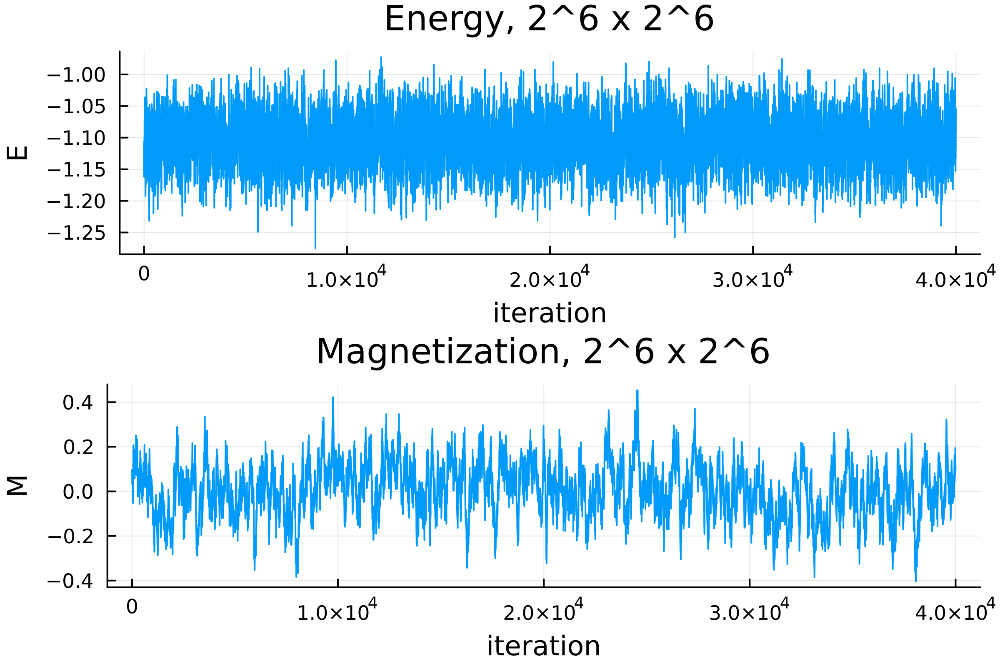

In [17]:
s=rand_ising2d(2^6,2^6)
β=0.4
# Run for 300 timesteps to get past transients
# Use the "innersweeps" so that we don't bother measuring
simulate!(s,β,0.,300,1)
# Take data for 10000 timesteps
@time run=simulate!(s,β,0.,1,40000)
efig=plot(run.Elist,label="",
        title="Energy, 2^6 x 2^6",xlabel="iteration",ylabel="E")
mfig=plot(run.maglist,label="",
    title="Magnetization, 2^6 x 2^6",xlabel="iteration",ylabel="M")
plot(efig,mfig,layout=[1,1],format=:png,dpi=400)

One Jupyter trick is that I made that plot with `format=:png`. That makes a bitmapped figure instead of a `svg`.  The figure is lower quality, but is a lot smaller.  This helps keep the notebook from slowing down. We can also make a `svg` with

In [18]:
#plot(efig,mfig,layout=[1,1],format=:svg)

Clearly the magnetization has a longer correlation time than the energy.  Lets look at its distribution:

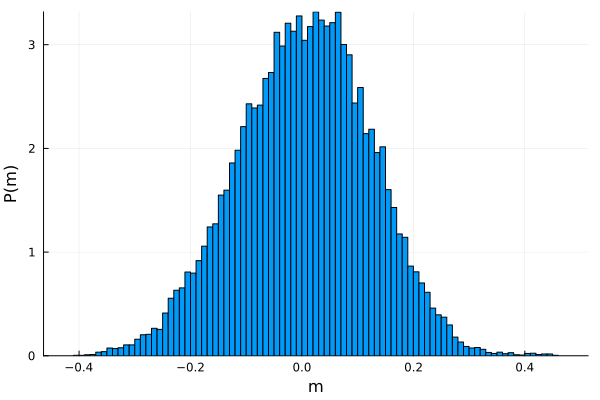

In [19]:
histogram(run.maglist,normed=true,xlabel="m",ylabel="P(m)",label="")

At first glance that looks similar to a Gaussian, but it clearly has smaller tails and is more "triangular" shaped.

To get the autocorrelation function, we can use our function from an earlier lecture:

\begin{equation}
C_j=\frac{\sum_i m_i m_{i+j}}{N_j}-\langle m\rangle^2,
\end{equation}
where $N_j$ is the number of points that are separated by $j$ timesteps

In [20]:
function autocorrelation(values,largestsep)
    m=mean(values)
    timesteps=length(values)
    [(values[1+j:end]⋅values[1:end-j])/(timesteps-j)-m^2 for j in 0:largestsep]
end

autocorrelation (generic function with 1 method)

In [21]:
magcor=autocorrelation(run.maglist,1000);

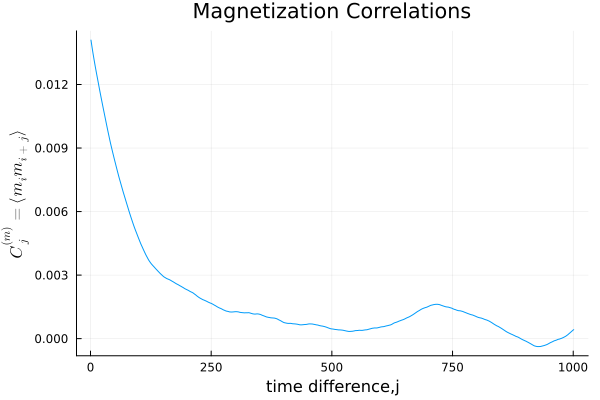

In [22]:
plot(magcor,xlabel="time difference,j",
    ylabel=L"$C_j^{(m)}=\langle m_i m_{i+j}\rangle$",label="",
    title="Magnetization Correlations")

As we see the correlation time is of order a hundred steps.  We can quantify things by noting that this curve is roughly triangular shaped.  If we take its area, and divide by its height we get a charactistic time

In [23]:
tau1=sum(magcor[j] for j in 2:500)/magcor[1]

107.3929273274867

This expression comes from thinking about exponentials:  Suppose our sequence is $m_j=A e^{-j/\tau}$, then
\begin{equation}
\sum_{j=1}^\infty e^{-j/\tau}=\frac{1}{e^{1/\tau}-1}\approx\tau.
\end{equation}

In [24]:
cortime(corlist)=sum(corlist)/corlist[1]-1

cortime (generic function with 1 method)

In [25]:
cortime(magcor)

129.77258800857243

Lets now look at the energy:

In [26]:
Ecor=autocorrelation(run.Elist,100);

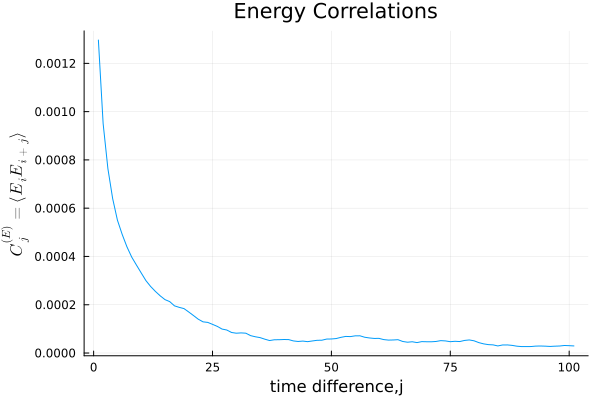

In [27]:
plot(Ecor,xlabel="time difference,j",
    ylabel=L"$C_j^{(E)}=\langle E_i E_{i+j}\rangle$",label="",
    title="Energy Correlations")

Clearly the energy correlation time is just a few steps.

In [28]:
cortime(Ecor)

9.073045273275667

<h2 style="border: 2px solid #000; border-radius: 10px; padding: 20px; background-color:red; color:white;" >
## Mini Lab 2
</h2>

The correlation times (and relaxation times) depend on parameters.  Redo this analysis for $\beta=0.43$. It turns out the autocorrelation time is quite long there -- so do more iterations -- say 100,000 timesteps 

<div style="border: 2px solid white; border-radius: 10px; padding: 20px; background-color:white; color:black; height: 500px" >
</div>

In [29]:
s=rand_ising2d(2^6,2^6)
β=0.43
# Run for 300 timesteps to get past transients
# Use the "innersweeps" so that we don't bother measureing
simulate!(s,β,0.,300,1)
# Take data for 10000 timesteps
@time run43=simulate!(s,β,0.,1,100000)
efig43=plot(run43.Elist,label="",
        title="Energy, 2^6 x 2^6",xlabel="iteration",ylabel="E")
mfig43=plot(run43.maglist,label="",
    title="Magnetization, 2^6 x 2^6",xlabel="iteration",ylabel="M")
plot(efig43,mfig43,layout=[1,1],format=:png,dpi=400)

  7.198014 seconds (24 allocations: 3.656 MiB)


LoadError: ParseError:
[90m# Error @ [0;0m]8;;file:///Users/emueller/Documents/Work Laptop 2011-2012/PHYS 4480-7680 Computational Physics/lectures/In[29]#12:33\[90mIn[29]:12:33[0;0m]8;;\
    title="Magnetization, 2^6 x 2^6",xlabel="iteration",ylabel="M")
plot(efig43,mfig43,layout=[1,1],[48;2;120;70;70m,format=:png,dpi=400[0;0m)
[90m#                               └──────────────────┘ ── [0;0m[91mExpected `)`[0;0m

We see that there appears to be multiple timescales.  There magnetization appears to spend some time rapidly oscillating around either 0.5 or -0.5.  On a longer time-scale it randomly jumps between those values.

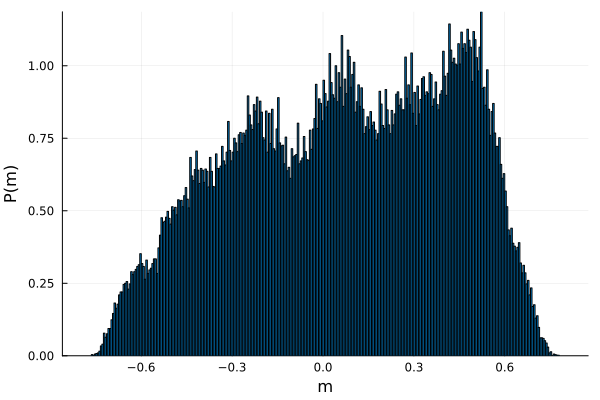

In [96]:
histogram(run43.maglist,bins=500,normed=true,
    xlabel="m",ylabel="P(m)",label="")

If we sampled for infinitely long this should be symmetric, but for a finite run like this, we ofen find that it spends more time around one location than the other.  **This indicates that we may want to get more samples.**

Note that the energy and the magnetization are correlated, so the energy also has oscillations on both these scales:

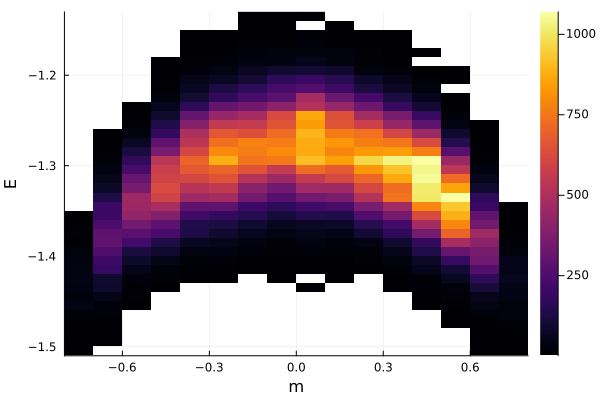

In [55]:
histogram2d(run43.maglist,run43.Elist,xlabel="m",ylabel="E")

We can calculate the autocorrelation function, and see that it has a long time constant:

In [32]:
magcor43=autocorrelation(run43.maglist,20000);

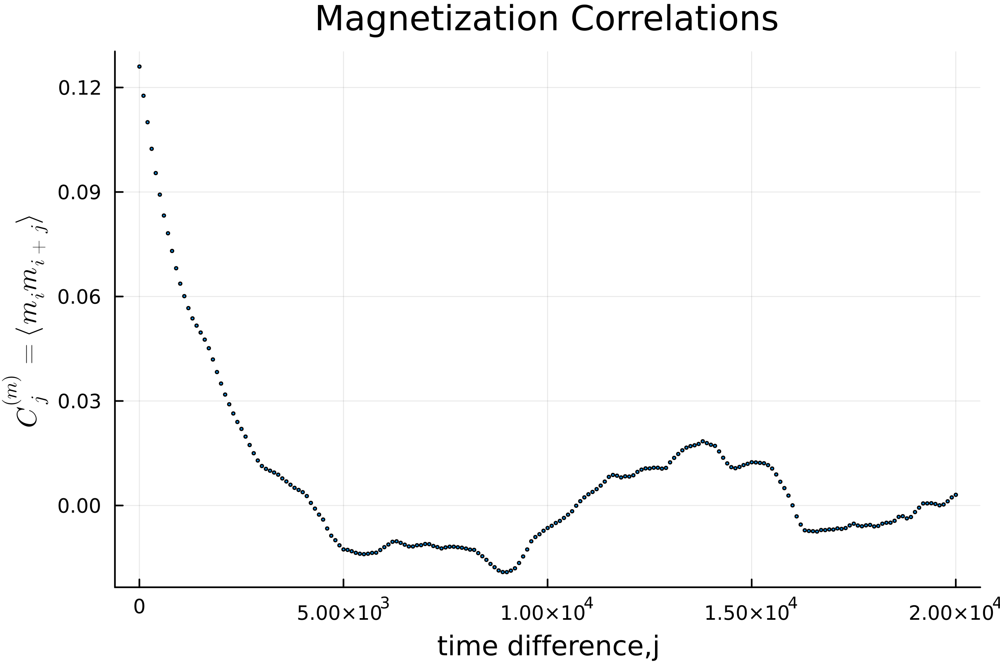

In [33]:
scatter(1:100:length(magcor43),magcor43[1:100:end],
    format=:png,dpi=400,
    markersize=1.,
    xlabel="time difference,j",
    ylabel=L"$C_j^{(m)}=\langle m_i m_{i+j}\rangle$",label="",
    title="Magnetization Correlations")

We clearly see a very long correlation time.  We also see some structure where the correlations become negative for some intermediate time.  We would probably need more realizations to quantify this behavior.  This correlation function looks very noisy -- which tells me that we need to do more averaging if we want to nicely quantify the correlations.

Most importantly, if we want to accurately sample $m$ -- we will need to get samples separated by many correlation times.

A final caution.  In this case, where we have very noisy data, our estimate of the correlation time may not be reliable.  Nonetheless:

In [34]:
cortime(magcor43)

1097.978023085172

Clearly that is shorter than we would visually expect.  That is because the negative correlations cancel out some of the positive correlations.  We can even end up with negative values, especially if we do not have enough statistics.

### Correlations of $|m|$

One important trick is that if we look at the correlation time for $|m|$, it is much shorter than $m$:  The occasional sign flips do not effect $|m|$ much

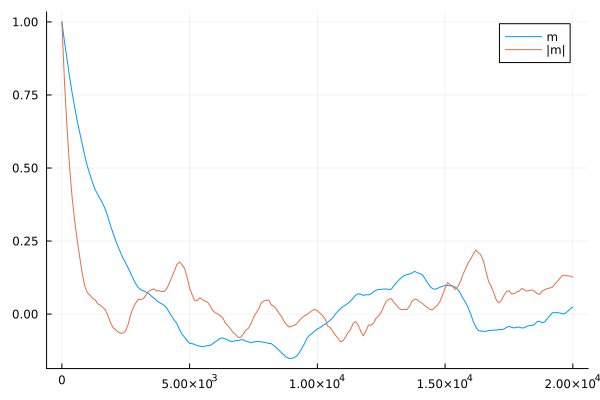

In [56]:
absmagcor43=autocorrelation(abs.(run43.maglist),20000);
plot(1:100:length(magcor43),magcor43[1:100:end]/magcor43[1],label="m")
plot!(1:100:length(absmagcor43),absmagcor43[1:100:end]/absmagcor43[1],label="|m|")

Again, things are noisy, so our estimate of the correlation time may not be useful.  The solution would be to run for more time.

In [36]:
cortime(magcor43)

1097.978023085172

In [37]:
cortime(absmagcor43)

1086.361512503022

## Error estimates from correlated data

### Error analysis from autocorrelation function

As long as we have enough uncorrelated samples, we can estimate the mean and the error bars of a quantity (like the magnetization).  Assuming we have discarded the initial transients, the sample mean is

\begin{align}
m^{(s)}&= \frac{1}{N}\sum_{j=1}^N m_j.
\end{align}
If I ran the simulation multiple times, I would get that the true mean is
\begin{align}
\bar m &= \langle m^{(s)}\rangle\\
&=\frac{1}{\Omega}{\sum_\alpha} m^{(s,\alpha)}
\end{align}
where $\langle\cdots\rangle$ means that we average over all the realizations, each of which is labeled by $\alpha$.  The number of realizations is $\Omega$  

Our estimate is that the mean is
approximately the sample mean.
\begin{align}
\bar m &\approx m^{(s)}.
\end{align}
Our estimate for the error is
\begin{align}
\mbox{err}^2 &\approx \langle (m^{(s)}-\bar m)^2\rangle\\
&=\frac{1}{N^2} \sum_{ij}\langle
 (m_i-\bar m)(m_j-\bar m)\rangle
\end{align}
where $N$ is the number of time-points in our Markov Chain.  We will assume that the correlation function only depends on the difference of times:
\begin{equation}
\langle m_i m_j\rangle-\bar m^2 = C_{i-j},
\end{equation}
and hence
\begin{align}
\mbox{err}^2 &\approx \frac{1}{N^2} \sum_{ij} C_{i-j}\\
&\approx \sum_\delta \frac{N-\delta}{N^2} C_\delta
\end{align}
where we have used that our data contains $N-\delta$ pairs that are separated by $\delta$ sites.  For large $N$, this simplifies to 
\begin{align}
\mbox{err}^2 &\approx \frac{1}{N} \sum_\delta C_\delta\\
&=\frac{\sigma^2(1+2\tau)}{N}
\end{align}
where 
\begin{align}
\sigma^2&=C_0\\ &=\sum_j m_j^2 -\bar m^2
\end{align}
is the standard deviation of the sample, and
\begin{align}
\tau&=\sum_{j=1}^\infty \frac{C_j}{C_0}
\end{align}
is the correlation time that we defined earlier.

In the special case where the points are uncorrelated $C_0=\sigma^2$ and $C_{\delta\neq0}=0$, we get our standard result $\mbox{err}\approx \sigma/\sqrt{N}$. 

The physical meaning is that the number of effectively independent samples is $N/(1+2\tau)$.

In [38]:
function esterror(data,maxsep)
    ac=autocorrelation(data,maxsep)
    tau=cortime(ac)
    @info "correlation time" tau
    m=mean(data)
    N=length(data)
    return (m,sqrt(ac[1]*(1+2*tau)/N))
end

esterror (generic function with 1 method)

In [57]:
esterror(run.maglist,2000)

┌ Info: correlation time
└   tau = 167.56022295996638


(0.005012060546875, 0.010884047469979554)

Note -- that up to terms that are small compared to the error bars, we can safely resample the data at a lower frequency

In [58]:
esterror(run.maglist[1:100:end],20)

┌ Info: correlation time
└   tau = 1.2933057587221537


(0.002850341796875, 0.010554513009540384)

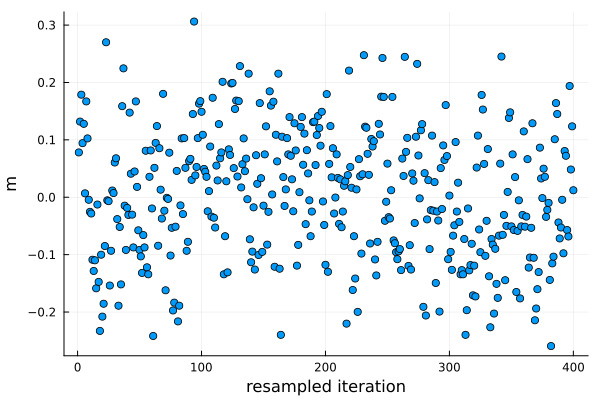

In [62]:
scatter(run.maglist[1:100:end],xlabel="resampled iteration",ylabel="m",label="")

It feels like we threw a lot of data out -- but there was no information in there (at least as far as calculating the mean went.  Thus we might as well have only stored one data point out of every hundred.

Here is the full data for reference

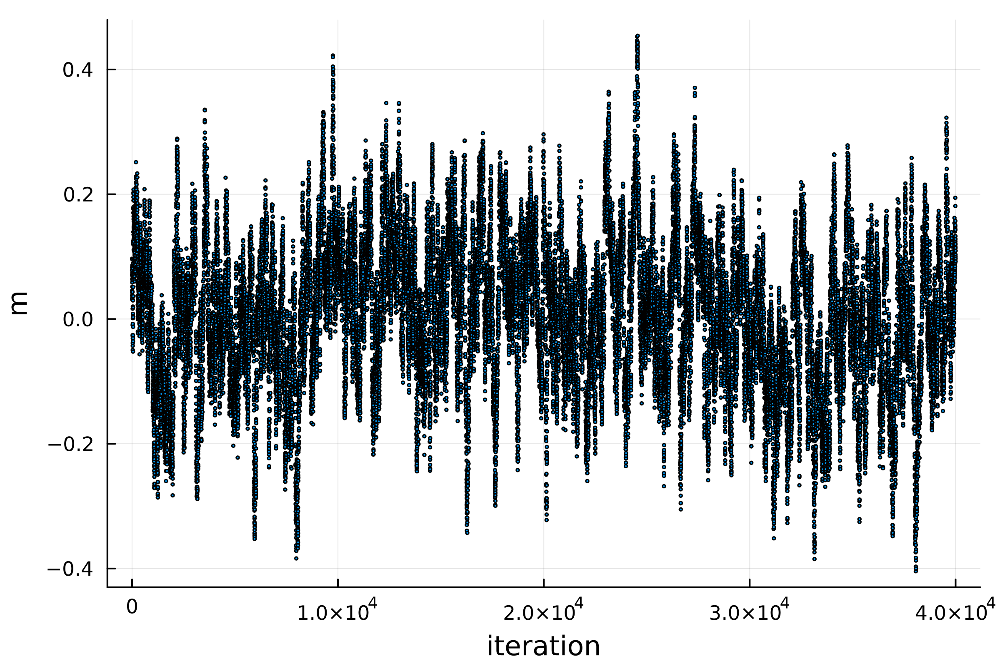

In [64]:
scatter(run.maglist,xlabel="iteration",ylabel="m",label="",format=:png,dpi=400,markersize=1.)

If we wanted to calculate the absolute value of the magnetization, however we do not want to resample quite so coarsely

In [76]:
esterror(abs.(run.maglist),2000)

┌ Info: correlation time
└   tau = 50.40542152653911


(0.0955463623046875, 0.0035651311540212923)

In [66]:
esterror(abs.(run.maglist)[1:20:end],100)

┌ Info: correlation time
└   tau = 1.8744311075087392


(0.094913330078125, 0.0034026727340627787)

In [67]:
esterror(abs.(run.maglist)[1:100:end],20)

┌ Info: correlation time
└   tau = -0.12480408711982782


(0.092642822265625, 0.002687182847169892)

The latter answer is shifted by almost a whole error bar.

### Rebinning analysis

A faster and more robust approach to calculating error bars is rebinning analysis.  What we do is take our data set of $N$ points, and break it into $M$ bins, each of $n=N/M$ points.   We then calculate the means of each bin.  If the data was independent then $\sigma_M^2/(M-1)$ would be independent of $M$.  With correlations, it will approach a constant as $M$ becomes smaller.  That constant is our estimate of the error bars.

In practice this is simpler than it sounds, and simpler than the correlation time approach.   We just define a convenient bin size.  We bin the data and calculate the error estimate by assuming those bins are independent.  As long as the bin size is larger than the correlation time we will get the right answer.

The rule of thumb that I generally hear is that you use 10 bins.

In [68]:
using Statistics
function binerror(data,numbins)
    len=length(data)
    binlength=floor(Int,len/numbins)
    binmeans=[mean(data[1+j*binlength:(j+1)*binlength])
        for j in 0:(numbins-1)]
    m=mean(binmeans)
    errsq=sum((b-m)^2 for b in binmeans)/((numbins)*(numbins-1))
    return(m,sqrt(errsq))
end

binerror (generic function with 1 method)

As an example.  Here is a set of uncorrelated random numbers.  We will bin them in bins of different size, and estimate the errors:

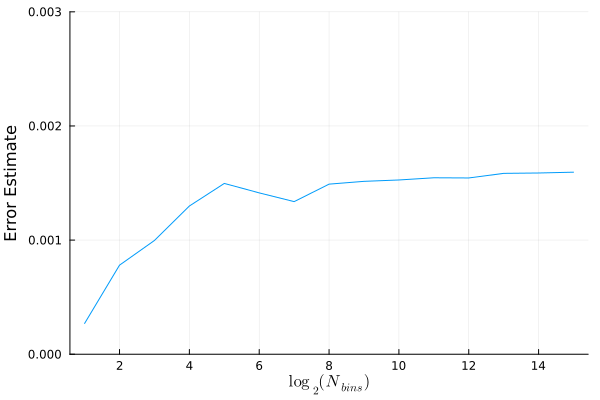

In [69]:
uc=rand(2^15);
bt=[binerror(uc,2^j)[2] for j in 1:15]
plot(bt,ylim=[0,0.003],xlabel=L"$\log_2(N_{\rm bins})$",ylabel="Error Estimate",label="")

The estimates get a bit funky when the number of bins is too small -- but even there the differences are off at most by a factor of 2.

Lets now do the same with our correlated data:

In [70]:
length(run.maglist)

40000

In [71]:
log(length(run.maglist))/log(2)

15.287712379549449

In [72]:
2^16

65536

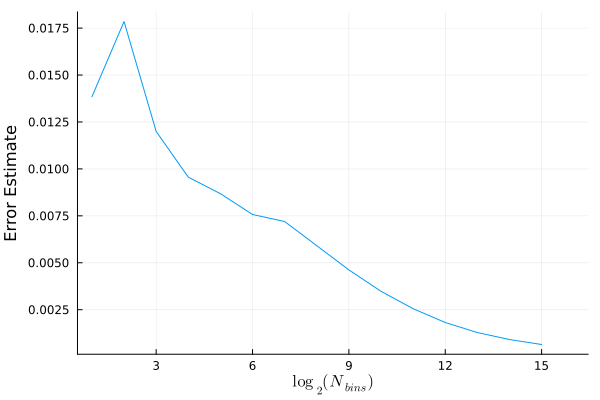

In [73]:
et=[binerror(run.maglist,2^j)[2] for j in 1:16]
plot(et,xlabel=L"$\log_2(N_{\rm bins})$",ylabel="Error Estimate",label="")

To decorrelate the data we want to take the limit of small number of bins.  This is easier to visualize on a linear scale

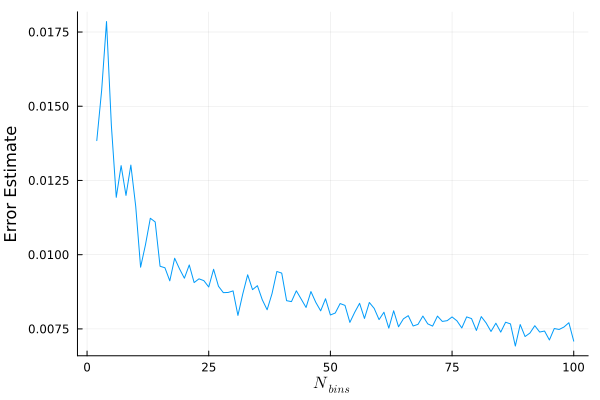

In [75]:
bins=1:100
et=[binerror(run.maglist,b)[2] for b in bins]
plot(collect(bins),et,xlabel=L"$N_{\rm bins}$",ylabel="Error Estimate",label="")

Thus I would estimate the error as 0.01 -- which is close to what we found with our correlation time analysis:

In [78]:
esterror((run.maglist),2000)

┌ Info: correlation time
└   tau = 167.56022295996638


(0.005012060546875, 0.010884047469979554)

If we used our rule of thumb and just used 10 bins:

In [79]:
binerror(run.maglist,10)

(0.005012060546875001, 0.011625070611361575)

That is close enough in my books:  We don't need a super high accuracy error estimate.

Lets now look at the absolute value of the magnetization

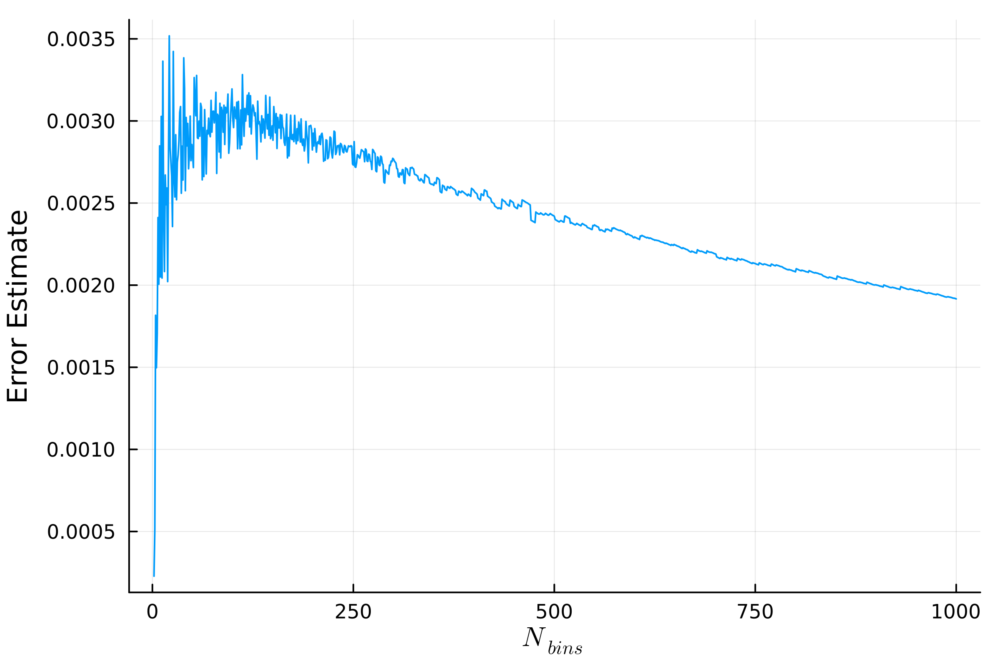

In [84]:
bins=1:1000
aet=[binerror(abs.(run.maglist),b)[2] for b in bins]
plot(collect(bins),aet,xlabel=L"$N_{\rm bins}$",ylabel="Error Estimate",label="",format=:png,dpi=400)

Again, if we just took 10 bins, we would get a reasonable estimate of the error

In [81]:
binerror(abs.(run.maglist),10)

(0.09554636230468751, 0.0020501852063316383)

In [82]:
binerror(abs.(run.maglist),20)

(0.0955463623046875, 0.0027575578096710168)

We are within a factor of 2 of what we found from our correlation-time based analysis

In [83]:
esterror(abs.(run.maglist),2000)

┌ Info: correlation time
└   tau = 50.40542152653911


(0.0955463623046875, 0.0035651311540212923)